In [3]:
import numpy as np
import torch
from neurodiffeq.neurodiffeq import safe_diff as diff
from neurodiffeq.ode import solve, solve_system
from neurodiffeq.conditions import IVP
from neurodiffeq.networks import FCNN # fully-connect neural network
import torch.nn as nn                 # PyTorch neural network module
from neurodiffeq.conditions import DirichletBVP2D #boundary conditions(we can also customize based on our needs)
from neurodiffeq.solvers import Solver2D
from neurodiffeq.monitors import Monitor2D
from neurodiffeq.generators import Generator2D
from neurodiffeq.conditions import IBVP1D 
from neurodiffeq.pde import make_animation
import copy
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"#否则内核时常挂掉
# check if GPU is available and use it; otherwise use CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")

import matplotlib.pyplot as plt
%matplotlib notebook
#plt.rcParams['animation.embed_limit'] = 2**128 # MB

# Primary optimiziers
In the training phase, an optimization process targeting the residual minimization determines the weights and biases of the surrogate network. Typically, we use two optimizers in succession: the Adam optimizer as first and then a Broyden-Fletcher-Goldfarb-Shanno (BFGS) optimizer. 

BFGS uses the Hessian matrix (curvature in highly dimensional space) to calculate the optimization direction and provides more accurate results. However, if used directly without using the Adam optimizer can rapidly converge to a local minimum (for the residual) without exiting. For this reason, the Adam optimizer is used first to avoid local minima, and then the solution is refined by BFGS. 

We note that the typical BFGS used in PINNs is the L-BFGS-B: L-BFGS is a limited-memory version of BFGS to handle problems with many variables, such as DL problems; the BFGS-B is a variant of BFGS for bound constrained optimization problems. In our work, we tested several optimizers, including Newton and Powell methods, and found that L-BFGS-B provides by far the highest accuracy and faster convergence in all our test problems. L-BFGS-B is currently the most critical technology for PINNs.

In [4]:
from itertools import chain

#  Specifying the Optimizer

We can change the optimization algorithms by passing a `torch.optim.Optimizer` object to `Solver*` classes and `solve*` functions as the `optimizer` argument. 

If you are familiar with PyTorch, you know that to initialize an `Optimizer`, we need to tell it the parameters to optimize. In other words, if we want to use a different optimizer from the default one, we also need to create our own networks. 

Here we create a fully connected network and prepare three types of optimizers `SGD`,`Adam`, and `L-BFGS-B` to optimize its weights. Then we use them to solve the PDEs. (Adam is the defaulted optimizer in this package)

In [5]:
#We control other parameters during training and the PiNN configuration itself
net_origin = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units=(64, 64, 64, 64), actv=nn.Tanh,)]

# benchmark initialized NN0
nets_adam = copy.deepcopy(net_origin)

nets_sgd = copy.deepcopy(net_origin)

nets_LBFGS = copy.deepcopy(net_origin)

train_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced-noisy')
valid_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced')

In [6]:
from torch.optim import SGD

sgd_Poisson = SGD(
    chain.from_iterable(n.parameters() for n in nets_sgd), # this gives all parameters in `nets`
    lr=0.001,                                          # learning rate
    momentum=0.99,                                     # momentum of SGD
)

In [7]:
from torch.optim import LBFGS

LBFGS_Poisson = LBFGS(
    chain.from_iterable(n.parameters() for n in nets_LBFGS), 
    lr=0.001,                                          
)

# Example 1: Poisson equation

Here we solve 2-D Poisson equation with an increasing frequency source term on a Cartesian boundary with Dirichlet boundary condition:

$$
F(u, x, y) = \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} = \frac{1}{4}\sum_{k = 1}^{4}(-1)^{k+1} \ 2k  \ sin(k\pi x)sin(k\pi y)
$$

Let us begin with the lowest frequency component k=1, we can write the particular equation as:

$$
F(u, x, y) = \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} =   \frac{1}{2}   sin(\pi x)sin(\pi y)
$$

for $(x, y) \in [0, 1] \times [0, 1]$

s.t.

$$
u(x, y)\bigg|_{x=0} = 0 \\
u(x, y)\bigg|_{x=1} = 0 \\
u(x, y)\bigg|_{y=0} = 0 \\
u(x, y)\bigg|_{y=1} = 0)
$$

The analytical solution is

$$
u(x, y) = - \ \frac{sin(\pi x)sin(\pi y)}{4 \pi^2}
$$

Here we have a Dirichlet boundary condition on both 4 edges of the orthogonal box. We will be using `DirichletBVP2D` for this boundary condition. The arguments `x_min_val`, `x_max_val`, `y_min_val` and `y_max_val` correspond to $u(x, y)\bigg|_{x=0}$, $u(x, y)\bigg|_{x=1}$, $u(x, y)\bigg|_{y=0}$ and $u(x, y)\bigg|_{y=1}$. Note that they should all be functions of $x$ or $y$. These functions are expected to take in a `torch.tensor` and return a `torch.tensor`.

In [8]:
# Define the PDE system
# There's only one (Laplace) equation in the system, so the function maps (u, x, y) to a single entry
# begin with the lowest frequency component k=1
k = 1

poisson1 = lambda u, x, y: [diff(u, x, order=2) + diff(u, y, order=2) - 0.5 * (-1)**(k+1) * k * torch.sin(k*np.pi*x) * torch.sin(k*np.pi*y)]

# Define the boundary conditions
# There's only one function to be solved for, so we only have a single condition
conditions = [
    DirichletBVP2D(
        x_min=0, x_min_val=lambda y: 0, 
        x_max=1, x_max_val=lambda y: 0, 
        y_min=0, y_min_val=lambda x: 0, 
        y_max=1, y_max_val=lambda x: 0,
    )
]

# Define the monitor callback
monitor=Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1))
monitor_callback = monitor.to_callback()

## Adam optimizer (lr = 0.001)

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


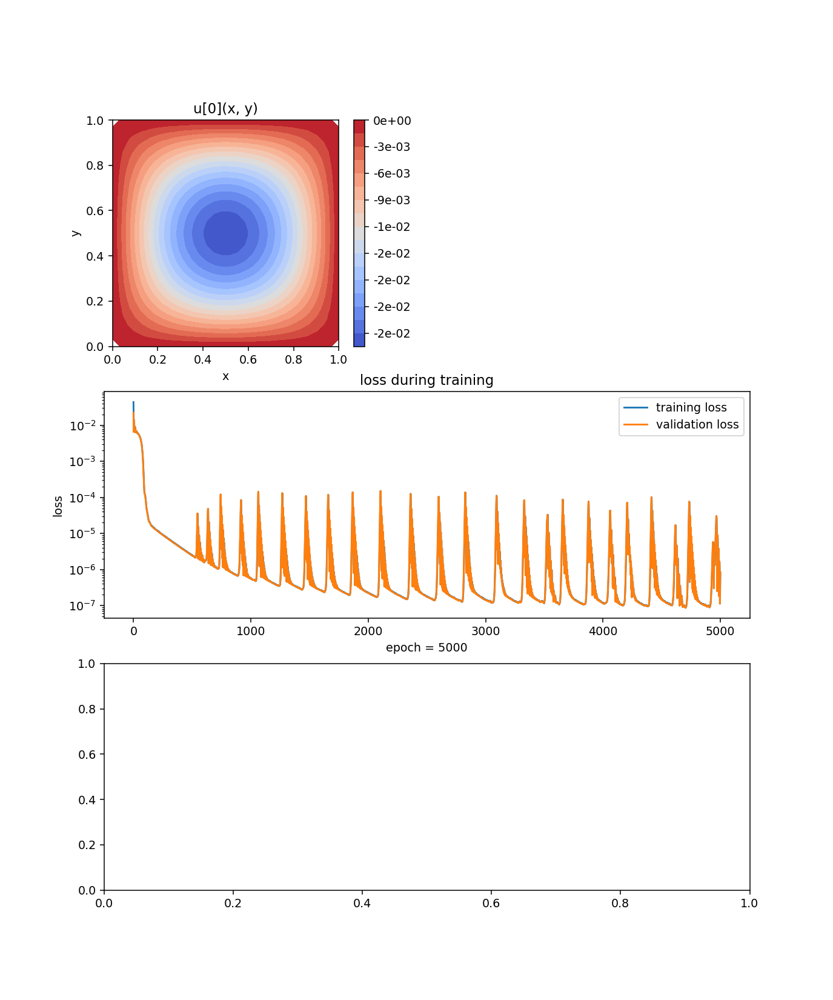

In [9]:
#Adam algorithm has already been the defaulted optimizer, so there is no need to claim again
solver1 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  # We can omit xy_min when both train_generator and valid_generator are specified
    xy_max=(1, 1),  # We can omit xy_max when both train_generator and valid_generator are specified
    nets=nets_adam,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

# Fit the neural network
solver1.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

# Obtain the solution
solution_poisson1 = solver1.get_solution()

## Stochasic Gradient Descent (SGD) optimizer (lr = 0.001)

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


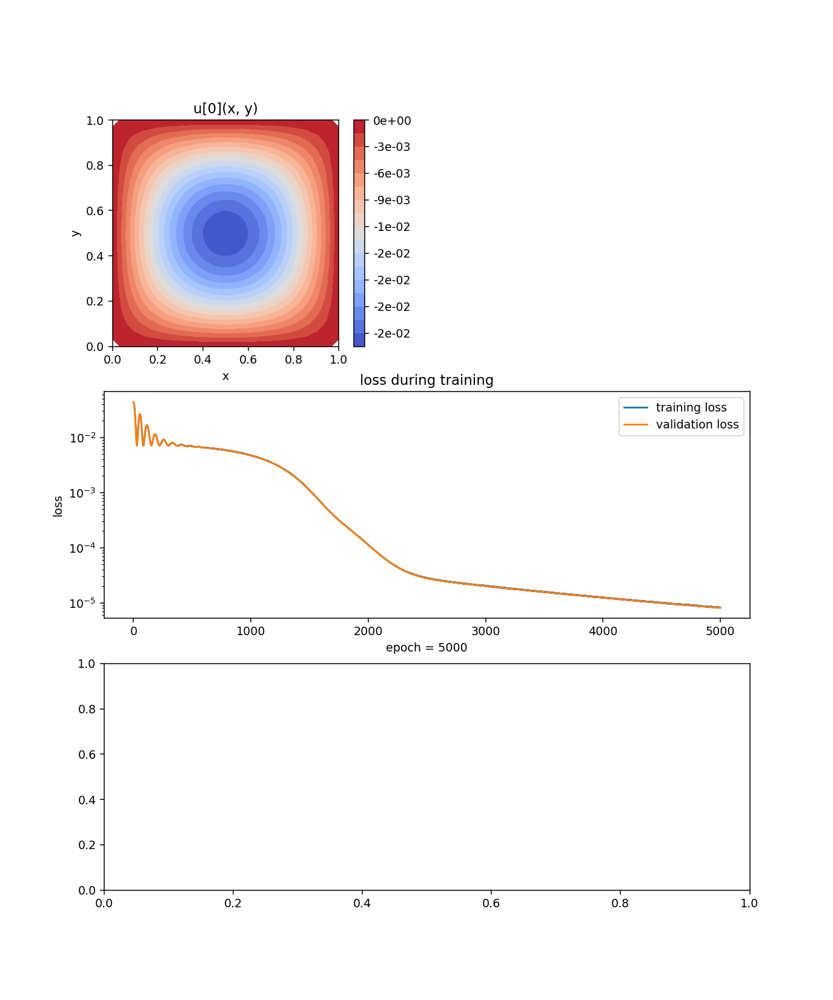

In [10]:
solver2 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0), 
    xy_max=(1, 1),
    nets=nets_sgd,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=sgd_Poisson,
)


solver2.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson2 = solver2.get_solution()

## L-BFGS-B optimizer (lr = 0.001)

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


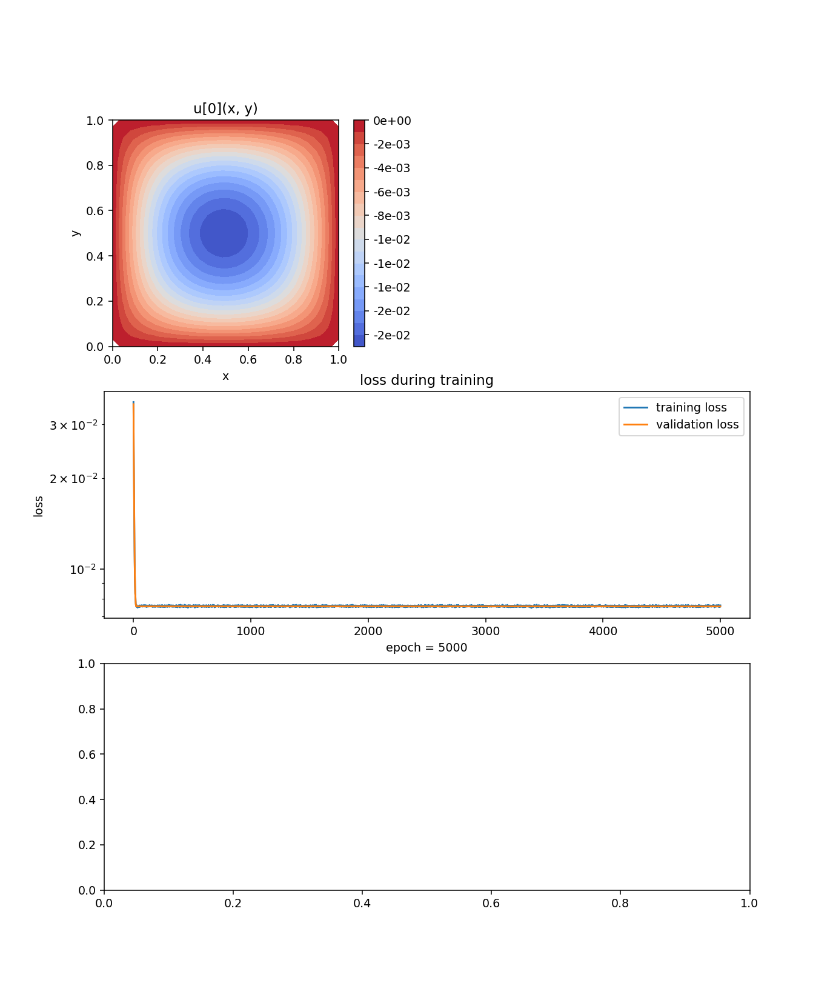

In [11]:
solver3 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_LBFGS,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS_Poisson,
)

solver3.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson3 = solver3.get_solution()

## Comparison with lr=0.001

In [12]:
loss_adam = solver1.metrics_history
print(loss_adam)

{'train_loss': [0.04412162303382667, 0.022484725259740625, 0.010266699140811547, 0.00657146963080373, 0.009491646012153113, 0.013329237508944256, 0.013773077768345434, 0.011673829475180097, 0.009010025136093022, 0.0071298408126748095, 0.006496647683439832, 0.006915564162291993, 0.007778427418756853, 0.00852363286267194, 0.008964757787710848, 0.008732494337041756, 0.008277683903495736, 0.007563818737890367, 0.006889181969567271, 0.006506066392449247, 0.006377271446186699, 0.006437102302220464, 0.00671874402892978, 0.006919935019677611, 0.007037838303116553, 0.006990097303140783, 0.006800258077474955, 0.006522381552871013, 0.006331592640818477, 0.006206249037196809, 0.006114394731968727, 0.006155866813260991, 0.00627837222844187, 0.006256822762067979, 0.006289538885795907, 0.00626512068826917, 0.006136024754503069, 0.005950311663937958, 0.005866478195094319, 0.005790132018625177, 0.005764994815867664, 0.005793581783801315, 0.005771541872037872, 0.005702463978790513, 0.005682797793204431,

In [13]:
loss_sgd = solver2.metrics_history
print(loss_sgd)

{'train_loss': [0.043911028810024, 0.04378792782700333, 0.04331471809592945, 0.04276890018296889, 0.04190843021619514, 0.04087611062059858, 0.039691884863360484, 0.038042821380192965, 0.03660077668260256, 0.0350896611982921, 0.03306997482480712, 0.03137089631261414, 0.029385382853362008, 0.027596656410137123, 0.02553855324558546, 0.023536702533229203, 0.02154959342124627, 0.019754856364343158, 0.017984423724309348, 0.016211200313822755, 0.014637394481685329, 0.013219918559194365, 0.011868468588330683, 0.010720347524716223, 0.00966137385790889, 0.008834148219170876, 0.008117224682640251, 0.007577698067884724, 0.007253328062284487, 0.007128880229902006, 0.007123062769078819, 0.0072892968150886, 0.007692024731884605, 0.008183108724249013, 0.00882466355380523, 0.009568109379176756, 0.010507010056959719, 0.011491665869358332, 0.01253572047457583, 0.013701545785304501, 0.014840987143078816, 0.01610374786954795, 0.017282382745815894, 0.018543896811483405, 0.019680253826710188, 0.0207964604300

In [14]:
loss_lbfgs = solver3.metrics_history
print(loss_lbfgs)

{'train_loss': [0.035585894224021274, 0.02929952264437897, 0.025624904325282877, 0.022990635186365828, 0.020105566640162123, 0.017583576743232205, 0.015772988669591443, 0.013928901218838663, 0.012438065139521932, 0.011437582456437185, 0.010611198020985712, 0.00984334590691185, 0.00935111845621282, 0.008928145988894881, 0.008548399006637564, 0.008319032127612792, 0.008260350304038055, 0.008035873882302265, 0.007889363176781947, 0.007785416905626159, 0.007671510199233185, 0.007650489280091958, 0.00756997703395369, 0.007578536305309211, 0.007547406282306903, 0.007538919845616168, 0.007530866272983439, 0.007513509161928452, 0.00760419752807371, 0.0075356222945731355, 0.007563141689234961, 0.007561197248249215, 0.007534349263640749, 0.00754949239029327, 0.007475083146908873, 0.007513875716258014, 0.007497840080075889, 0.007537379065594173, 0.007527387627034462, 0.0075293474881482185, 0.007489144617584293, 0.007548947685847649, 0.00754534069843016, 0.007552401089881409, 0.007546584003102527,

## Adam optimizer (lr=0.01)

In [15]:
#Reinitialize the neural networks


train_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced-noisy')
valid_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced')

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


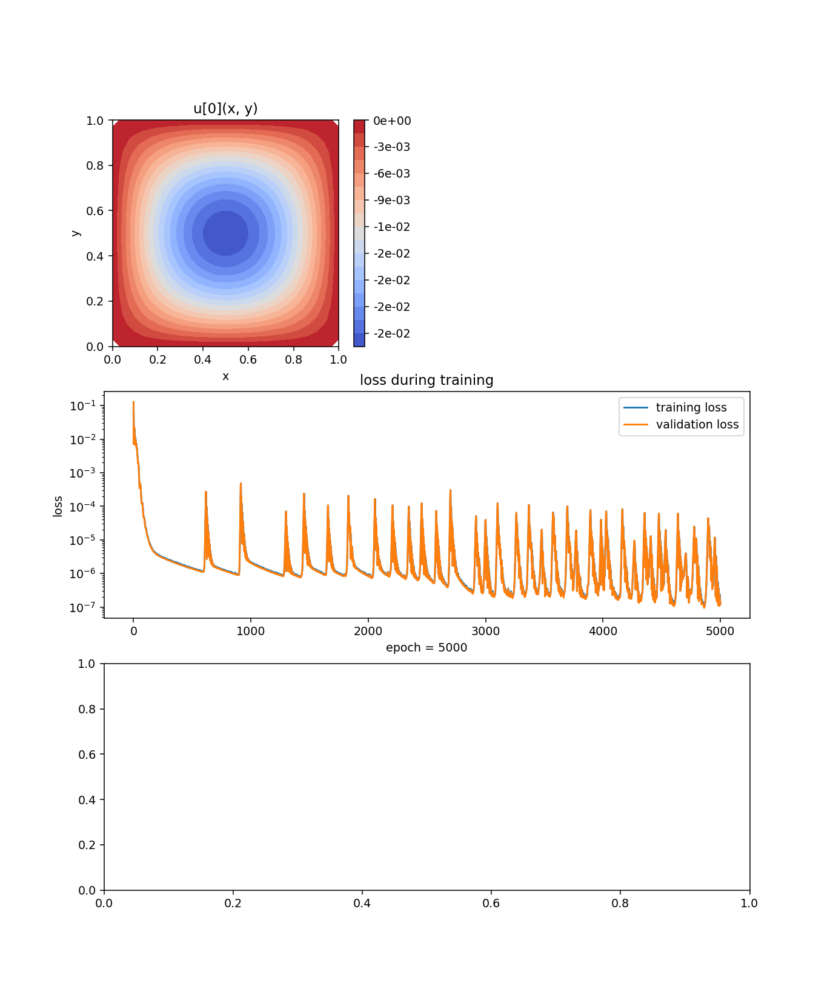

In [16]:
from torch.optim import Adam
nets_adam1 = copy.deepcopy(net_origin)
solver11 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_adam1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer= Adam(chain.from_iterable(n.parameters() for n in nets_adam1), lr=0.01)
)

# Fit the neural network
solver11.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

# Obtain the solution
solution_poisson11 = solver11.get_solution()

## SGD optimizer (lr=0.01)

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


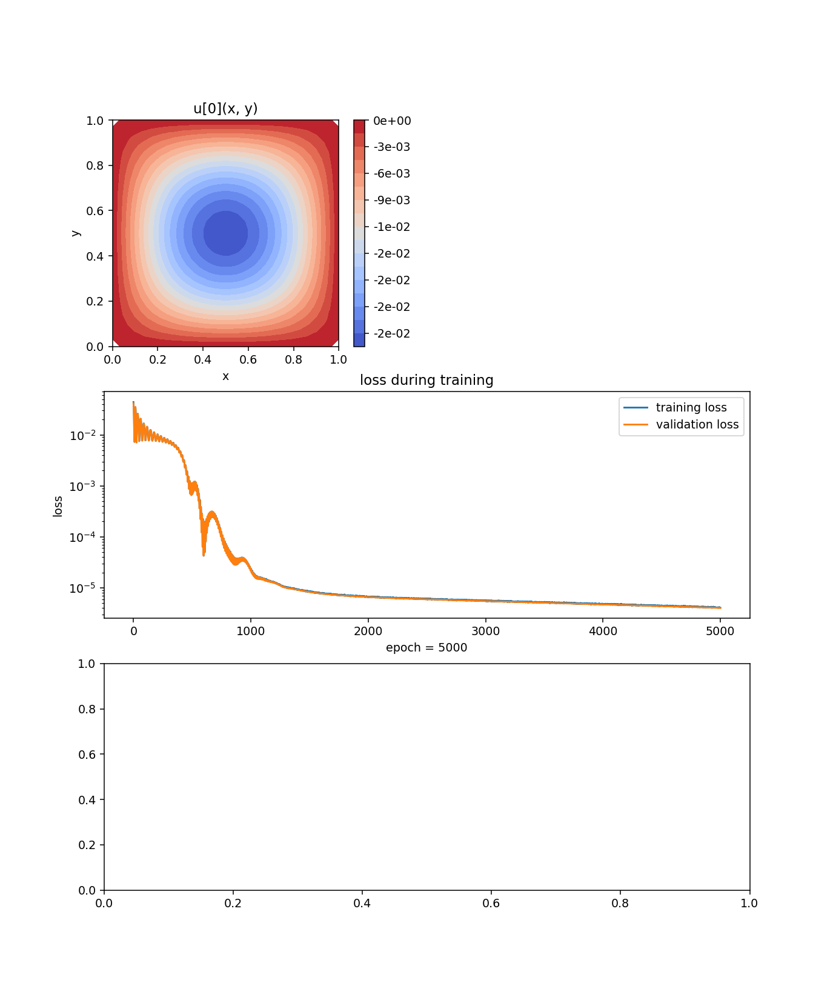

In [17]:
nets_sgd1 = copy.deepcopy(net_origin)

solver22 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0), 
    xy_max=(1, 1),
    nets=nets_sgd1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=SGD(
    chain.from_iterable(n.parameters() for n in nets_sgd1), # this gives all parameters in `nets`
    lr=0.01,                                          # learning rate
    momentum=0.99,                                     # momentum of SGD
),
)


solver22.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson22 = solver22.get_solution()

## L-BFGS-B optimizer (lr=0.01)

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


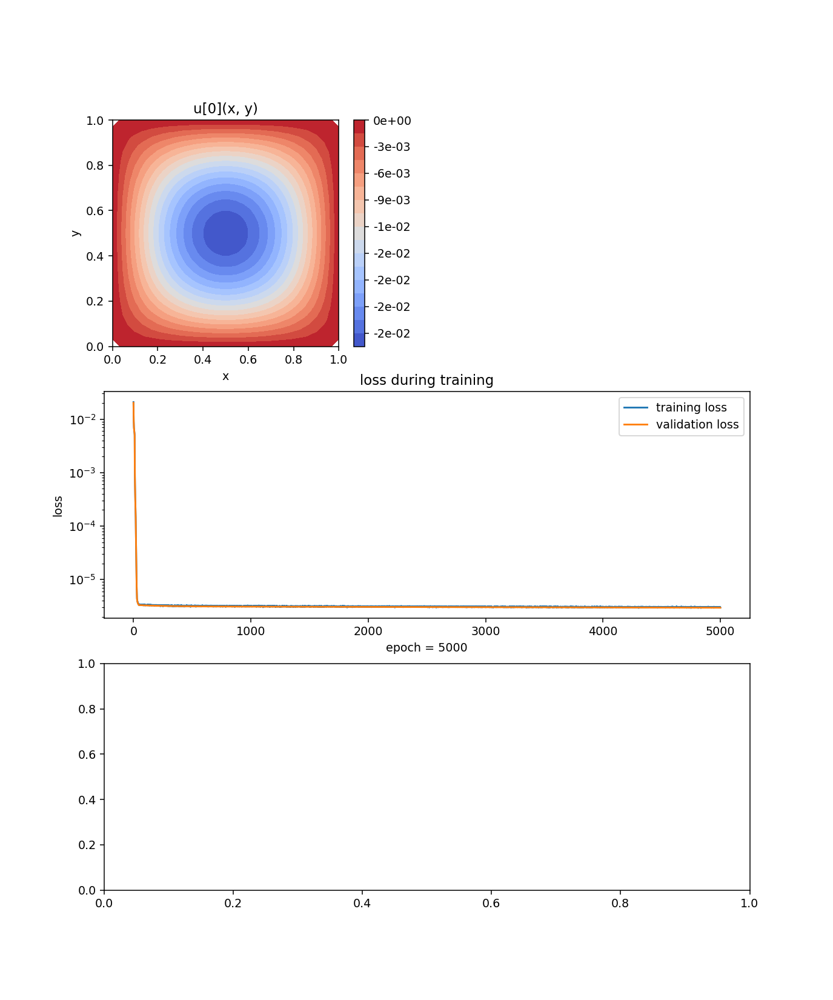

In [18]:
nets_LBFGS1 = copy.deepcopy(net_origin)

solver33 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_LBFGS1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(
    chain.from_iterable(n.parameters() for n in nets_LBFGS1), 
    lr=0.01,                                          
),
)

solver33.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson33 = solver33.get_solution()

## Adam optimizer (lr=0.1)

In [19]:
from torch.optim import Adam
#Reinitialize the neural networks


nets_adam11 = copy.deepcopy(net_origin)
nets_sgd11 = copy.deepcopy(net_origin)
nets_LBFGS11 = copy.deepcopy(net_origin)

train_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced-noisy')
valid_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced')

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


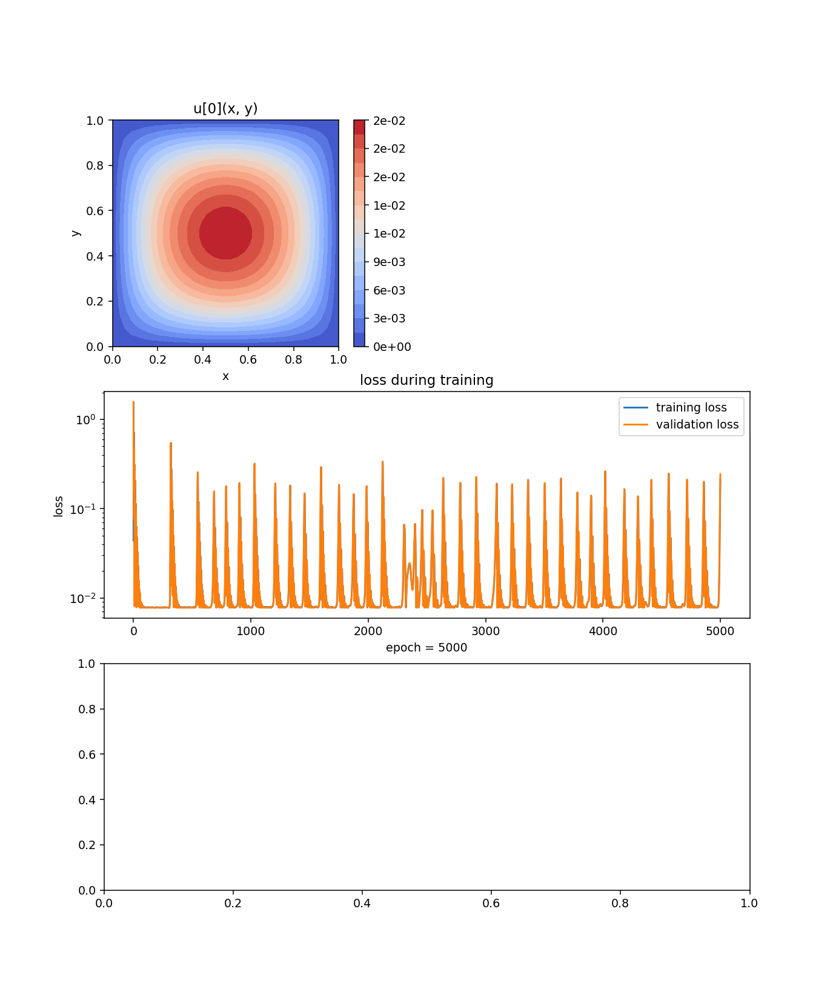

In [20]:
solver111 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  # We can omit xy_min when both train_generator and valid_generator are specified
    xy_max=(1, 1),  # We can omit xy_max when both train_generator and valid_generator are specified
    nets=nets_adam11,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer= Adam(chain.from_iterable(n.parameters() for n in nets_adam11), lr=0.1)
)

# Fit the neural network
solver111.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

# Obtain the solution
solution_poisson111 = solver111.get_solution()

## SGD optimizer (lr=0.1)

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


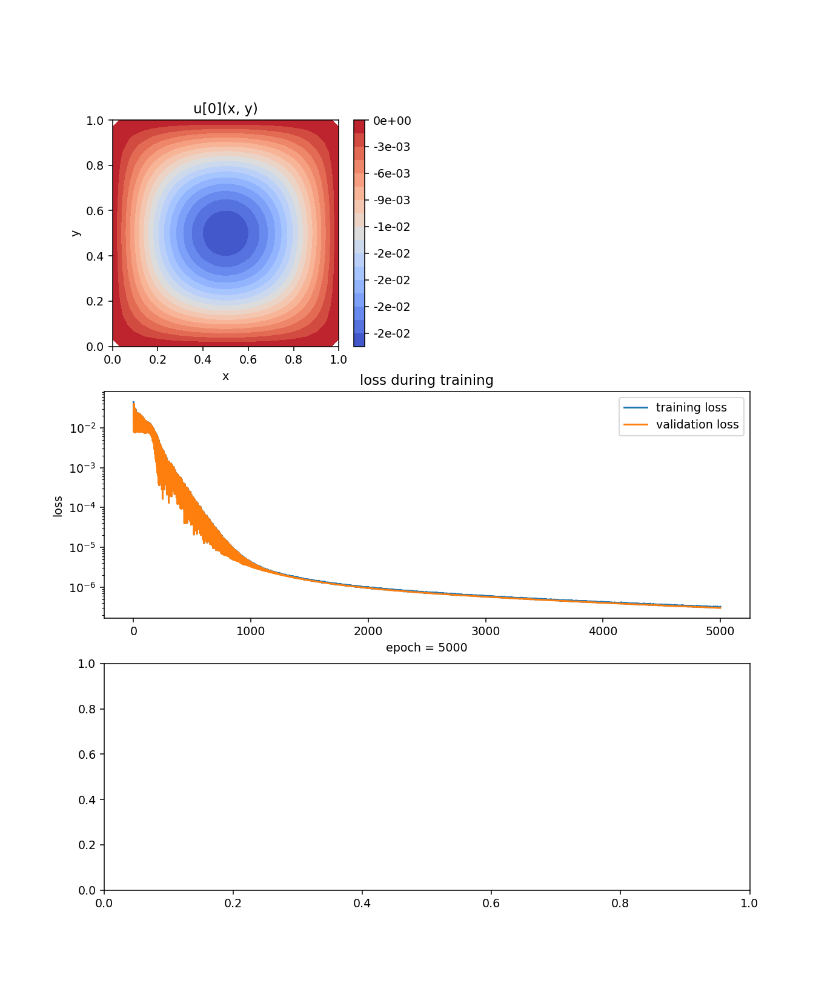

In [21]:
from torch.optim import SGD

solver222 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0), 
    xy_max=(1, 1),
    nets=nets_sgd11,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=SGD(
    chain.from_iterable(n.parameters() for n in nets_sgd11), # this gives all parameters in `nets`
    lr=0.1,                                          # learning rate
    momentum=0.99,                                     # momentum of SGD
),
)


solver222.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson222 = solver222.get_solution()

## L-BFGS-B optimizer (lr=0.1)

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


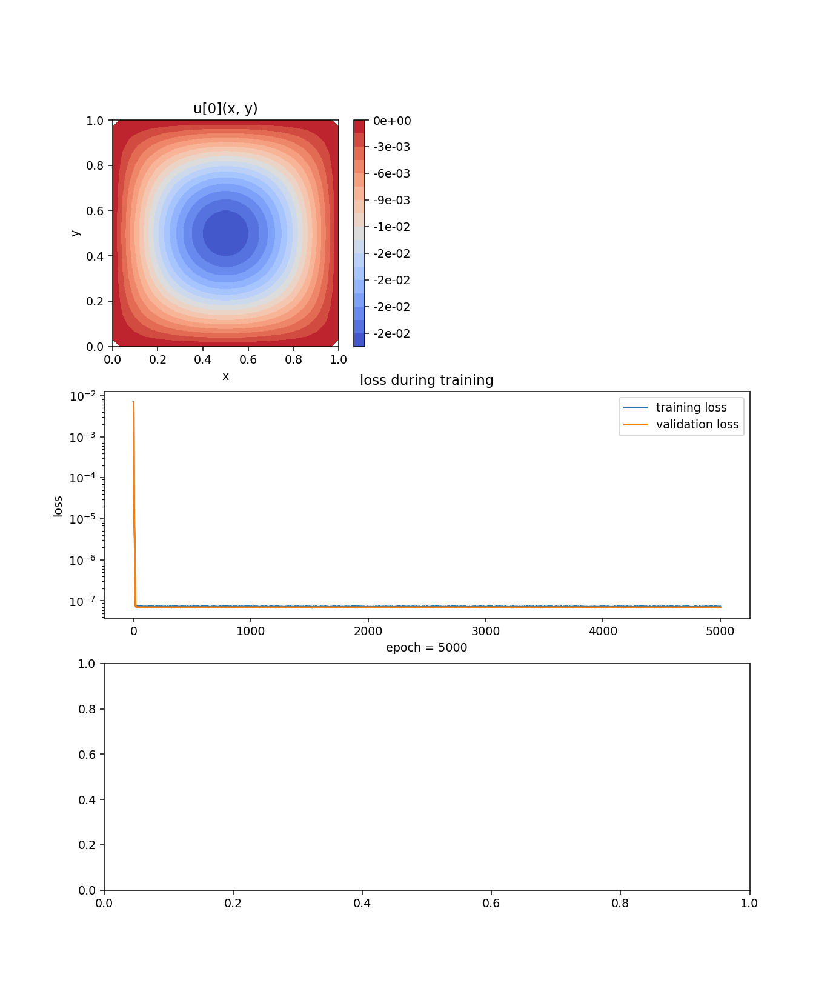

In [22]:
from torch.optim import LBFGS

solver333 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_LBFGS11,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(
    chain.from_iterable(n.parameters() for n in nets_LBFGS11), 
    lr=0.1,                                          
),
)

solver333.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson333 = solver333.get_solution()

# Results

## Comparison with different optimizers (lr=0.001)

<IPython.core.display.Javascript object>


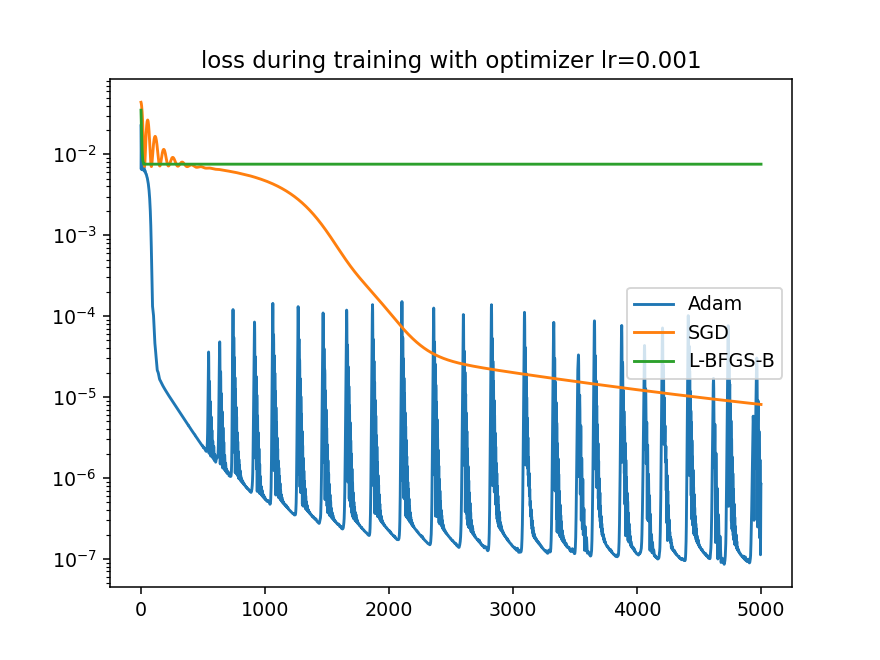

In [23]:
plt.figure()
plt.plot(loss_adam['valid_loss'], label='Adam')
plt.plot(loss_sgd['valid_loss'], label='SGD')
plt.plot(loss_lbfgs['valid_loss'], label='L-BFGS-B')
plt.yscale('log')
plt.title('loss during training with optimizer lr=0.001')
plt.legend()
plt.show()

## Comparison with different optimizers (lr=0.01)

In [24]:
loss_adam1 = solver11.metrics_history
loss_sgd1 = solver22.metrics_history
loss_lbfgs1 = solver33.metrics_history

<IPython.core.display.Javascript object>


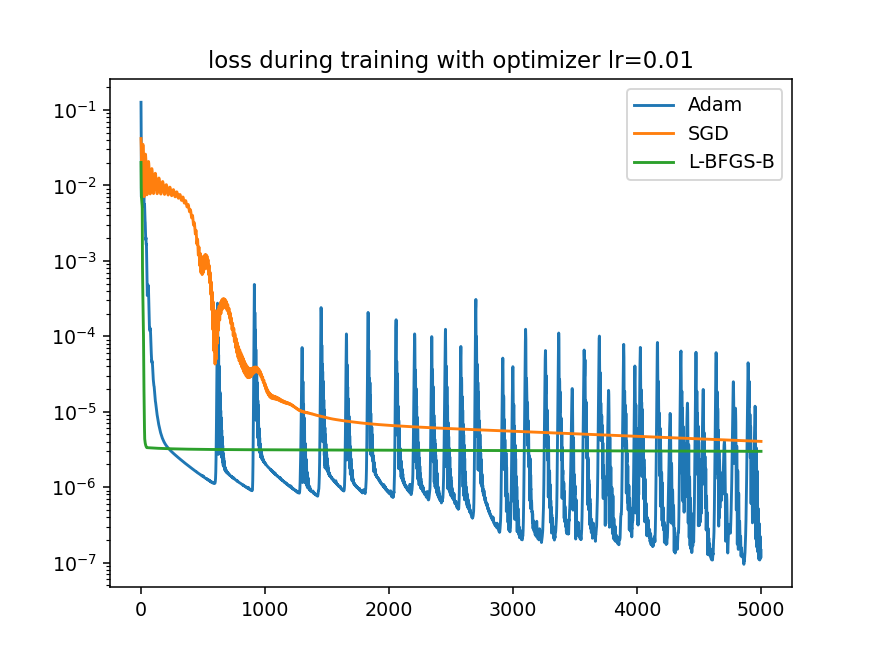

In [25]:
plt.figure()
plt.plot(loss_adam1['valid_loss'], label='Adam')
plt.plot(loss_sgd1['valid_loss'], label='SGD')
plt.plot(loss_lbfgs1['valid_loss'], label='L-BFGS-B')
plt.yscale('log')
plt.title('loss during training with optimizer lr=0.01')
plt.legend()
plt.show()

## Comparison with different optimizers (lr=0.1)

In [26]:
loss_adam11 = solver111.metrics_history
loss_sgd11 = solver222.metrics_history
loss_lbfgs11 = solver333.metrics_history

<IPython.core.display.Javascript object>


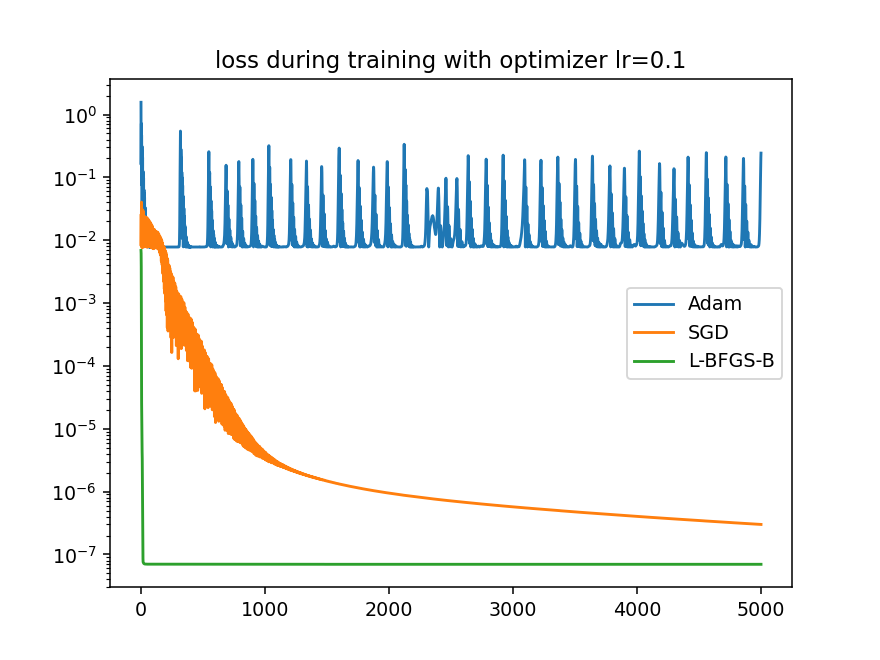

In [27]:
plt.figure()
plt.plot(loss_adam11['valid_loss'], label='Adam')
plt.plot(loss_sgd11['valid_loss'], label='SGD')
plt.plot(loss_lbfgs11['valid_loss'], label='L-BFGS-B')
plt.yscale('log')
plt.title('loss during training with optimizer lr=0.1')
plt.legend()
plt.show()

## Comparison with different learning rates (Adam)

<IPython.core.display.Javascript object>


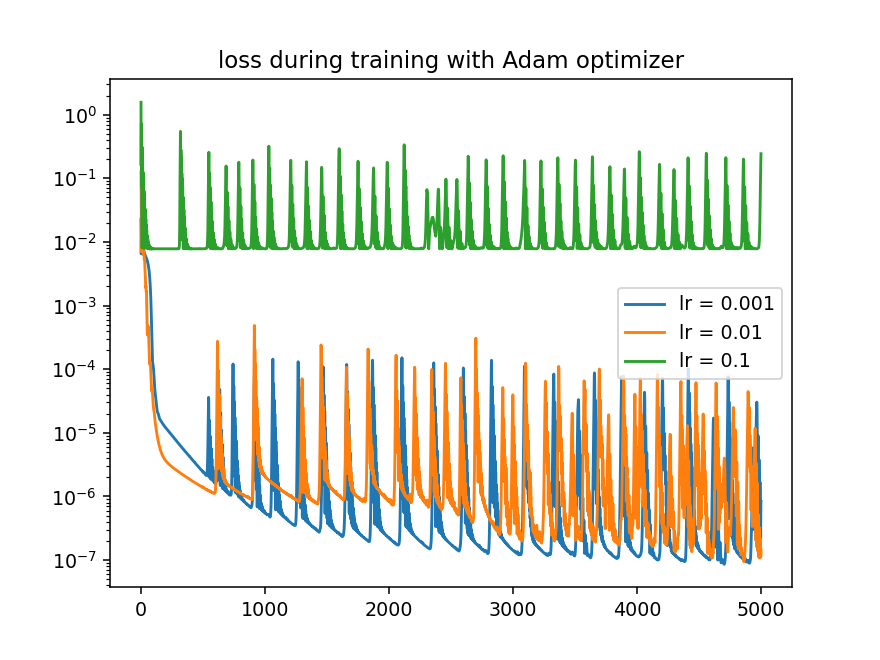

In [28]:
plt.figure()
plt.plot(loss_adam['valid_loss'], label='lr = 0.001')
plt.plot(loss_adam1['valid_loss'], label='lr = 0.01')
plt.plot(loss_adam11['valid_loss'], label='lr = 0.1')
plt.yscale('log')
plt.title('loss during training with Adam optimizer')
plt.legend()
plt.show()

## Comparison with different learning rates (SGD)

<IPython.core.display.Javascript object>


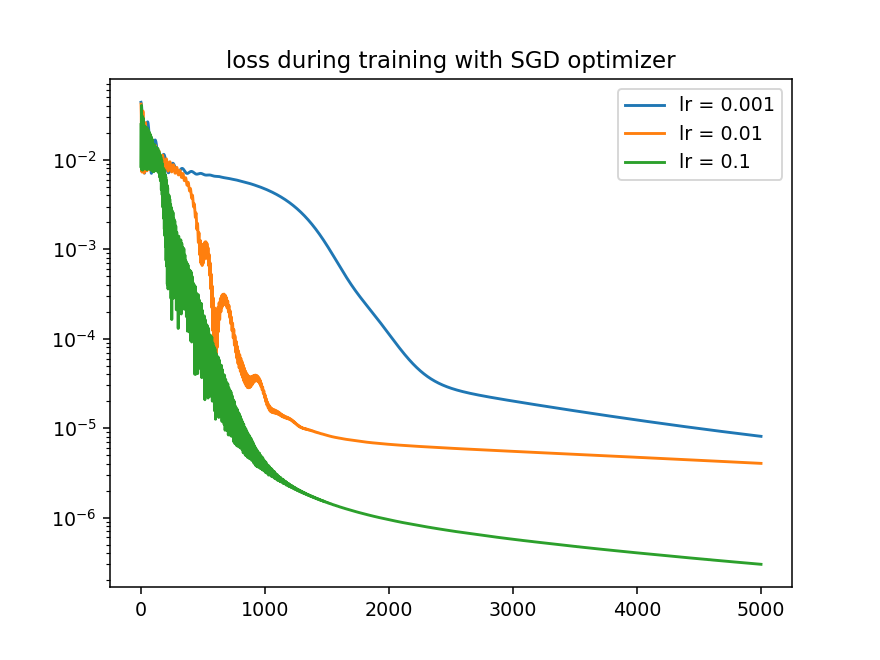

In [29]:
plt.figure()
plt.plot(loss_sgd['valid_loss'], label='lr = 0.001')
plt.plot(loss_sgd1['valid_loss'], label='lr = 0.01')
plt.plot(loss_sgd11['valid_loss'], label='lr = 0.1')
plt.yscale('log')
plt.title('loss during training with SGD optimizer')
plt.legend()
plt.show()

## Comparison with different learning rates (L-BFGS-B)

<IPython.core.display.Javascript object>


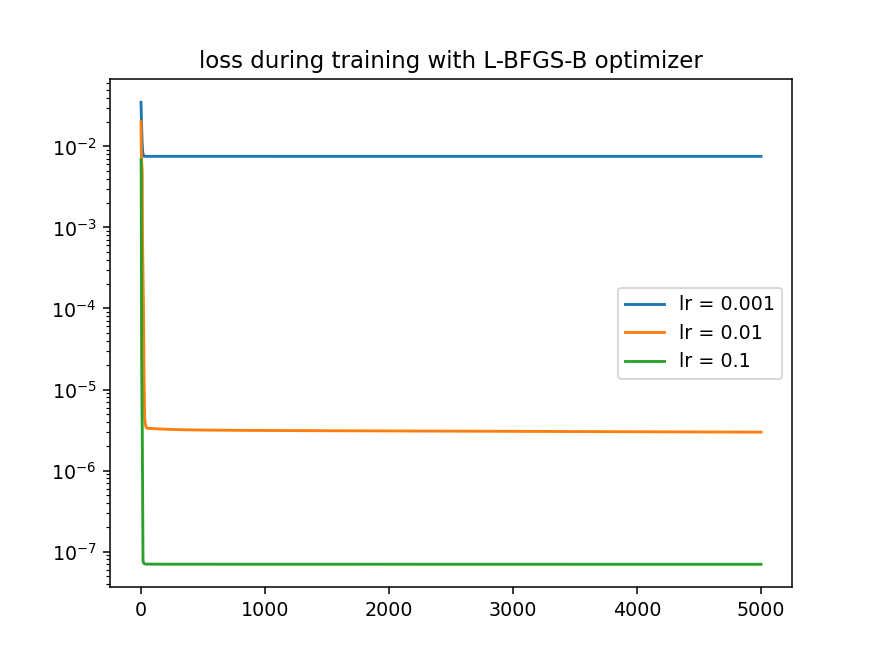

In [30]:
plt.figure()
plt.plot(loss_lbfgs['valid_loss'], label='lr = 0.001')
plt.plot(loss_lbfgs1['valid_loss'], label='lr = 0.01')
plt.plot(loss_lbfgs11['valid_loss'], label='lr = 0.1')
plt.yscale('log')
plt.title('loss during training with L-BFGS-B optimizer')
plt.legend()
plt.show()

# Why the valid loss of training by Adam optimizer is fluctuating?

Let's check the residual of the PiNN solutions with optimizer lr=0.001, finding out the distribution pattern of loss peaks.

In [32]:
from mpl_toolkits.mplot3d  import Axes3D
def plt_surf(xx, yy, zz, z_label='u', x_label='x', y_label='y', title=''):
    fig  = plt.figure(figsize=(16, 8))
    ax   = Axes3D(fig)
    surf = ax.plot_surface(xx, yy, zz, rstride=2, cstride=1, alpha=0.8, cmap='hot')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel(z_label)
    fig.suptitle(title)
    ax.set_proj_type('ortho')
    plt.show()
    
xs = np.linspace(0, 1, 101)
ts = np.linspace(0, 1, 101) 
xx, tt = np.meshgrid(xs, ts)

## lr = 1e-3

<IPython.core.display.Javascript object>


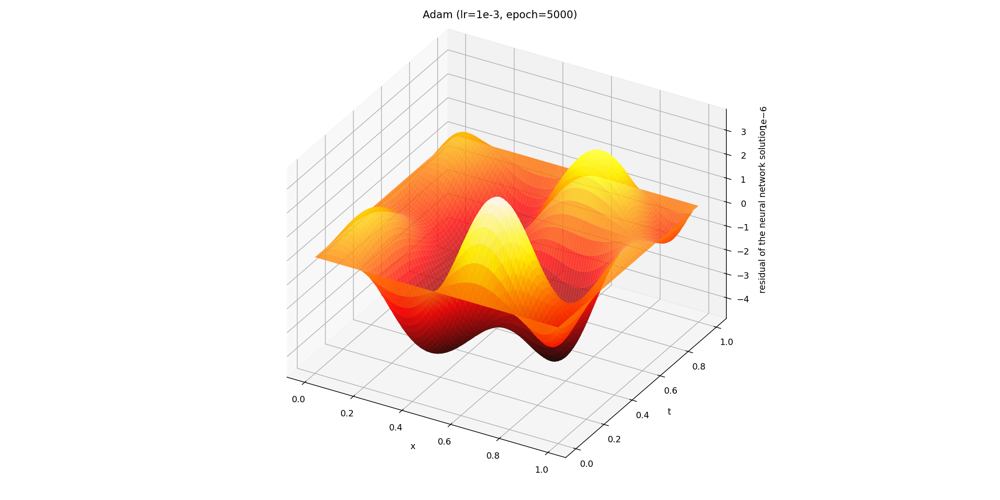

In [33]:
solution_analytical = lambda x, t: -np.sin(np.pi*x)*np.sin(np.pi*t)/(4*np.pi**2)
sol_ana = solution_analytical(xx, tt)
sol_net1 = solution_poisson1(xx, tt, to_numpy=True)
sol_net2 = solution_poisson2(xx, tt, to_numpy=True)
sol_net3 = solution_poisson3(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net1-sol_ana, y_label='t', z_label='residual of the neural network solution',title='Adam (lr=1e-3, epoch=5000)')

<IPython.core.display.Javascript object>


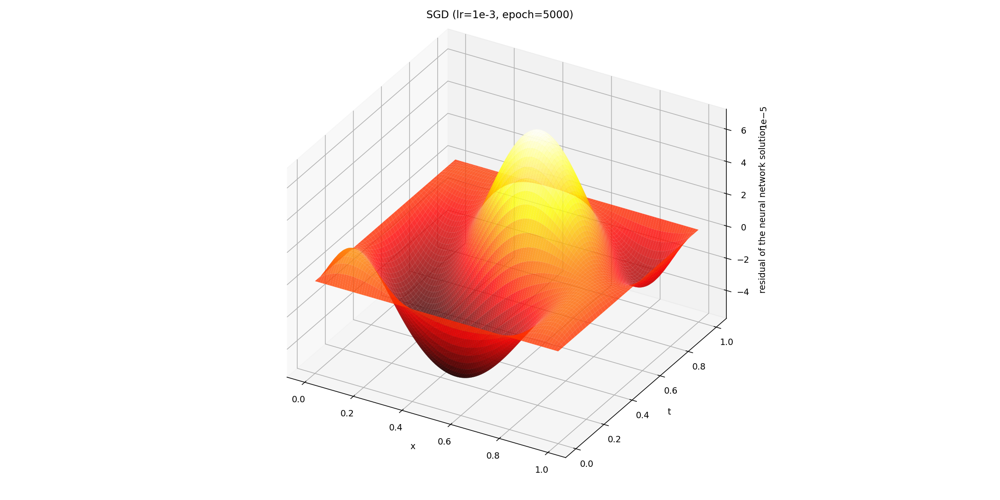

In [34]:
plt_surf(xx, tt, sol_net2-sol_ana, y_label='t', z_label='residual of the neural network solution',title='SGD (lr=1e-3, epoch=5000)')

<IPython.core.display.Javascript object>


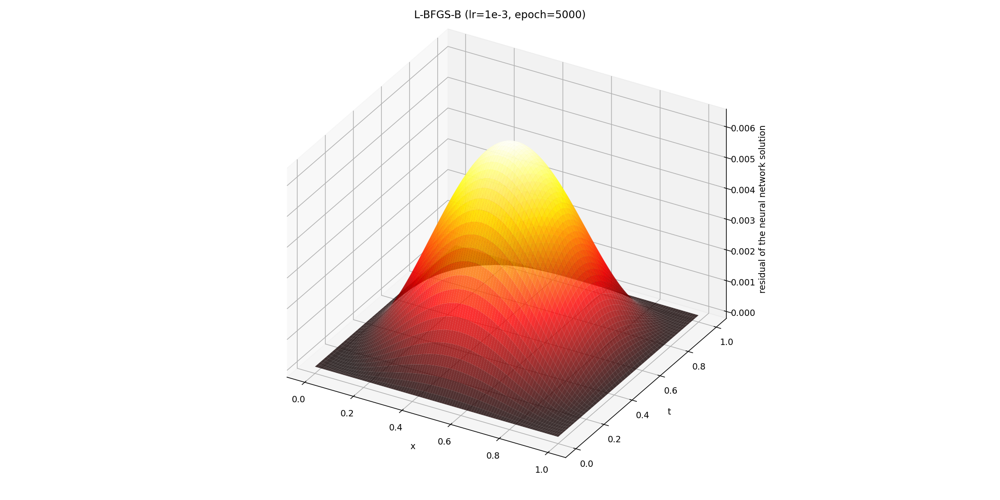

In [35]:
plt_surf(xx, tt, sol_net3-sol_ana, y_label='t', z_label='residual of the neural network solution',title='L-BFGS-B (lr=1e-3, epoch=5000)')

## lr = 1e-2

<IPython.core.display.Javascript object>


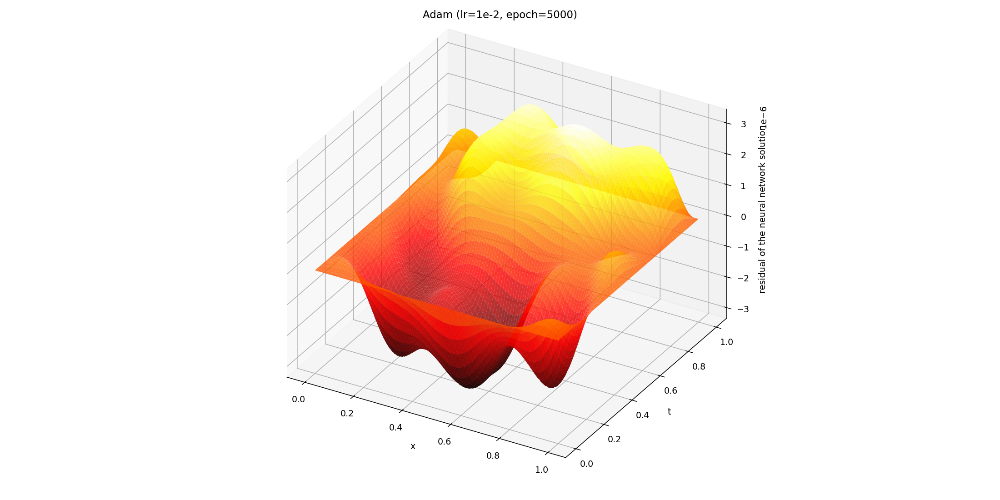

<IPython.core.display.Javascript object>


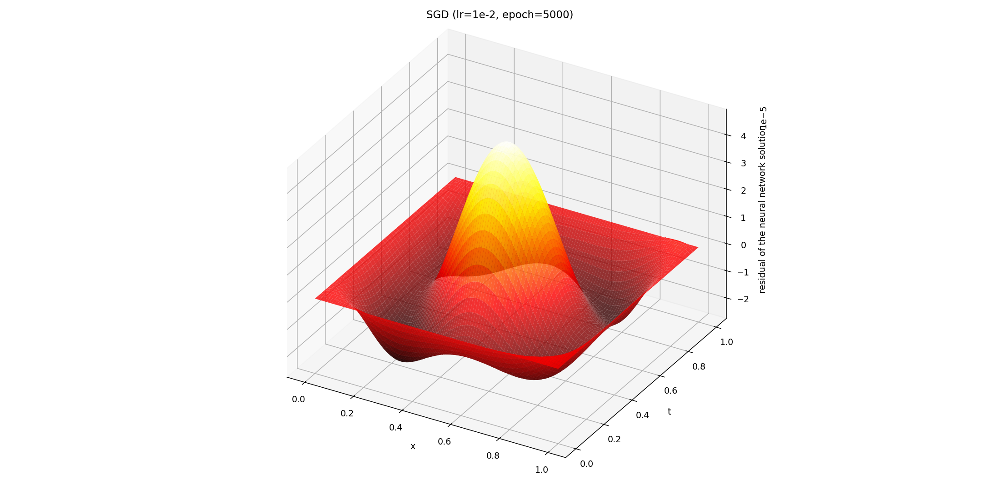

<ipython-input-32-0690cb51aba9>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig  = plt.figure(figsize=(16, 8))


<IPython.core.display.Javascript object>


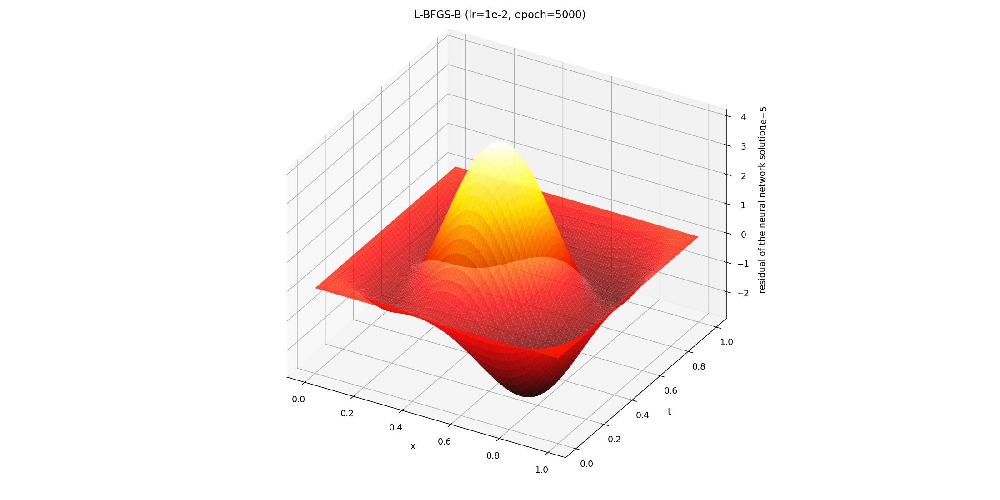

In [36]:
sol_net11 = solution_poisson11(xx, tt, to_numpy=True)
sol_net22 = solution_poisson22(xx, tt, to_numpy=True)
sol_net33 = solution_poisson33(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net11-sol_ana, y_label='t', z_label='residual of the neural network solution',title='Adam (lr=1e-2, epoch=5000)')
plt_surf(xx, tt, sol_net22-sol_ana, y_label='t', z_label='residual of the neural network solution',title='SGD (lr=1e-2, epoch=5000)')
plt_surf(xx, tt, sol_net33-sol_ana, y_label='t', z_label='residual of the neural network solution',title='L-BFGS-B (lr=1e-2, epoch=5000)')

## lr = 1e-1

<IPython.core.display.Javascript object>


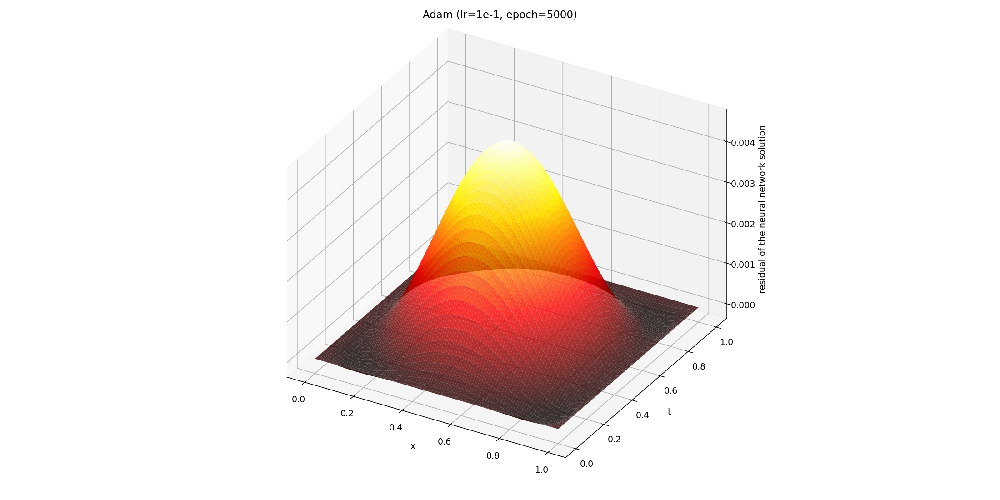

<IPython.core.display.Javascript object>


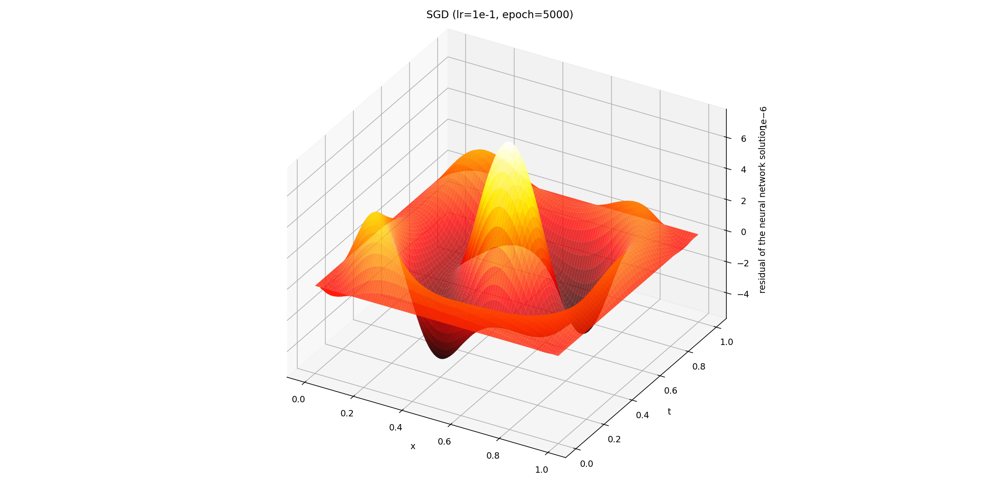

<IPython.core.display.Javascript object>


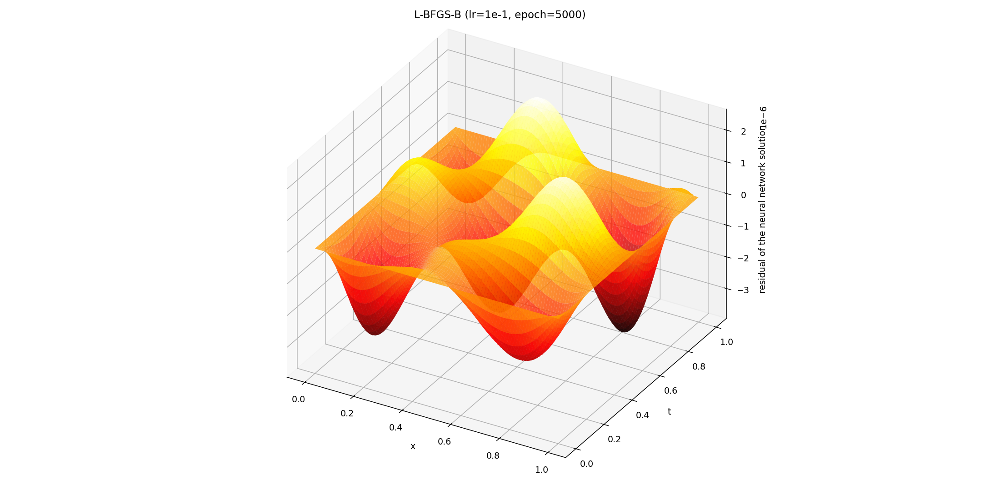

In [37]:
sol_net111 = solution_poisson111(xx, tt, to_numpy=True)
sol_net222 = solution_poisson222(xx, tt, to_numpy=True)
sol_net333 = solution_poisson333(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net111-sol_ana, y_label='t', z_label='residual of the neural network solution',title='Adam (lr=1e-1, epoch=5000)')
plt_surf(xx, tt, sol_net222-sol_ana, y_label='t', z_label='residual of the neural network solution',title='SGD (lr=1e-1, epoch=5000)')
plt_surf(xx, tt, sol_net333-sol_ana, y_label='t', z_label='residual of the neural network solution',title='L-BFGS-B (lr=1e-1, epoch=5000)')

# Questions:

## Frequency-principle (F-principle)
We choose such a source term as it has a simple solution and to show the F-principle’s impact on the convergence of PINN to the numerical solution: we expect the lower frequency components, e.g., 𝑘 = 1, to convergence faster than the higher frequency components present in the solution (𝑘 = 2, 3, 4). Please verify this phenomenon.

## Which is the best Optimizer?
From the above simulation results, we can tell that the computation performance of L-BFGS-B completely wins other two optimizers (Adam and SGD). Is this the case for more general situations?